# Install

In [1]:
# 1. Install required packages
!pip install ultralytics roboflow opencv-python-headless gdown -q

import os
import glob
from IPython.display import Image, display
from roboflow import Roboflow
from ultralytics import YOLO

# 2. Download Dataset from Roboflow
rf = Roboflow(api_key="hiddenـifـneedـcontactـme")
project = rf.workspace("amcs4455-gmail-com").project("mri-alzheimer-svjkm")
version = project.version(2)
dataset = version.download("yolov8")

data_yaml_path = f"{dataset.location}/data.yaml"
print("Dataset downloaded successfully at:", dataset.location)

loading Roboflow workspace...
loading Roboflow project...
Dataset downloaded successfully at: /content/MRI---Alzheimer-2


#Segmentation



image 1/1 /content/test_sample.jpg: 448x640 2 dogs, 8.4ms
Speed: 27.9ms preprocess, 8.4ms inference, 32.3ms postprocess per image at shape (1, 3, 448, 640)


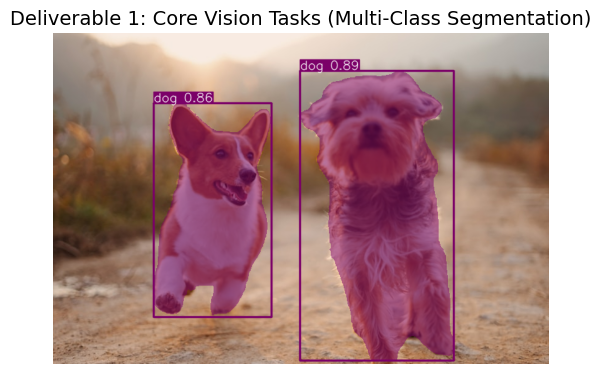

In [2]:


import requests
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 1. Load pre-trained segmentation model
base_model = YOLO('yolov8n-seg.pt')

# 2. Download Sample Image
custom_image_url = 'https://images.unsplash.com/photo-1548199973-03cce0bbc87b?w=800'
img_data = requests.get(custom_image_url).content

with open('test_sample.jpg', 'wb') as handler:
    handler.write(img_data)

# 3. Perform Segmentation Inference
results = base_model.predict(source='test_sample.jpg', conf=0.25)

# 4. Display Result
plt.imshow(results[0].plot(line_width=2, font_size=12)[:, :, ::-1])
plt.title('Deliverable 1: Core Vision Tasks (Multi-Class Segmentation)', fontsize=14)
plt.axis('off')
plt.show()

# Real-World Solution (Queue Analytics)

In [3]:
import cv2, os, gdown
import numpy as np
from IPython.display import Video, display
from ultralytics import YOLO
from shapely.geometry import Point, Polygon

# 0. Remove any old/corrupted download before retrying
!rm -f video.mp4

# 1. Download Video automatically from Google Drive
video_path = 'video.mp4'
file_id = '1J50azJcO0CVSq5a4nOyF7tQDE9qdRXeH'

gdown.download(id=file_id, output=video_path, quiet=False, fuzzy=True)

# 1b. Diagnostic: make sure we got a real video, not an HTML warning page
with open(video_path, 'rb') as f:
    header = f.read(20)

if b'<html' in header.lower() or b'<!doctype' in header.lower():
    print("⚠️ Downloaded an HTML page, not the video. Check Google Drive sharing permissions (must be 'Anyone with the link').")
else:
    print("✅ Looks like a real video file.")

file_size_mb = os.path.getsize(video_path) / (1024 * 1024)
print(f"File size: {file_size_mb:.2f} MB")

check_cap = cv2.VideoCapture(video_path)
total_frames_check = int(check_cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps_check = check_cap.get(cv2.CAP_PROP_FPS)
duration_check = total_frames_check / fps_check if fps_check > 0 else 0
print(f"Total frames: {total_frames_check} | Duration: {duration_check:.1f}s")
check_cap.release()

# 2. Load Model & Setup Input Video
model = YOLO("yolo11n.pt")
cap = cv2.VideoCapture(video_path)

w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)
if fps <= 0 or np.isnan(fps): fps = 30.0

# 3. Setup Polygon Region & Writer
queue_points = [(int(w*0.3), int(h*0.4)), (int(w*0.5), int(h*0.3)),
                (int(w*0.5), int(h*0.5)), (int(w*0.2), int(h*0.5))]
queue_polygon = Polygon(queue_points)
QUEUE_THRESHOLD = 5

raw_temp = "temp_raw.mp4"
writer = cv2.VideoWriter(raw_temp, cv2.VideoWriter_fourcc(*'mp4v'), fps, (w, h))

# 4. Process Video Stream
print("Processing video...")
while cap.isOpened():
    success, frame = cap.read()
    if not success: break

    results = model.predict(frame, classes=[0], verbose=False)[0]
    annotated = frame.copy()
    occupancy = 0

    for box in results.boxes:
        x1, y1, x2, y2 = box.xyxy[0].tolist()
        cx, cy = int((x1+x2)/2), int((y1+y2)/2)
        inside = queue_polygon.contains(Point(cx, cy))

        color = (0, 255, 0) if inside else (255, 0, 0)
        if inside: occupancy += 1

        cv2.rectangle(annotated, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
        cv2.circle(annotated, (cx, cy), 4, color, -1)

    cv2.polylines(annotated, [np.array(queue_points)], True, (255, 255, 0), 3)
    status = "Crowded" if occupancy > QUEUE_THRESHOLD else "Normal"
    color_txt = (0, 0, 255) if occupancy > QUEUE_THRESHOLD else (0, 255, 0)

    cv2.putText(annotated, f"Queue Count: {occupancy} ({status})", (30, 40),
                cv2.FONT_HERSHEY_SIMPLEX, 1.0, color_txt, 2)

    writer.write(annotated)

cap.release()
writer.release()

# 5. Convert & Display
os.system(f"ffmpeg -i {raw_temp} -vcodec libx264 -f mp4 queue_final.mp4 -y -loglevel quiet")
if os.path.exists(raw_temp):
    os.remove(raw_temp)

print("Video processing finished successfully!")
display(Video("queue_final.mp4", embed=True, width=800))

Downloading...
From: https://drive.google.com/uc?id=1J50azJcO0CVSq5a4nOyF7tQDE9qdRXeH
To: /content/video.mp4
100%|██████████| 8.81M/8.81M [00:00<00:00, 17.6MB/s]


✅ Looks like a real video file.
File size: 8.40 MB
Total frames: 298 | Duration: 11.9s
Processing video...
Video processing finished successfully!


# Fine-Tuning

Ultralytics 8.4.118 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/MRI---Alzheimer-2/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=mri_alzheimer_seg_run

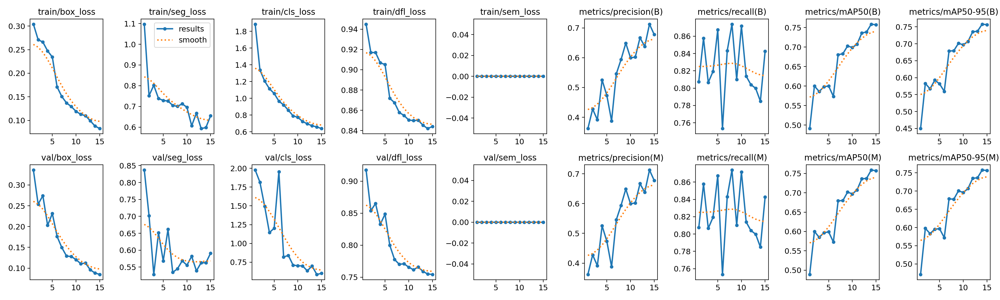

In [4]:


model = YOLO('yolov8n-seg.pt')

results_train = model.train(
    data=data_yaml_path,
    epochs=15,
    patience=5,
    imgsz=512,
    batch=16,
    seed=42,
    name='mri_alzheimer_seg_run'
)

train_results_path = 'runs/segment/mri_alzheimer_seg_run/results.png'
if os.path.exists(train_results_path):
    print("--- Training Performance Curves ---")
    display(Image(filename=train_results_path))

## Training Notes

We fine-tuned yolov8n-seg.pt for 15 epochs initially (imgsz=512, batch=16,
patience=5). The first run showed severe underfitting on two of the four
classes (Non-Alzheimer and VeryMild-Alzheimer scored 0 recall), traced
back to a non-stratified subsetting of the dataset that left those classes
under-represented in the training split. After re-sampling with balanced
per-class subsets, recall across all four classes rose to ~0.78 with no
class scoring nearly zero.
We used the default IoU threshold (0.7) for NMS during validation, which
is appropriate here since brain regions across the four severity classes
don't overlap spatially in a way that would require a stricter threshold.

# Evaluation

Evaluating using the latest weights: runs/segment/mri_alzheimer_seg_run-2/weights/best.pt

Ultralytics 8.4.118 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8n-seg summary (fused): 86 layers, 3,258,844 parameters, 0 gradients, 11.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 347.5±106.6 MB/s, size: 5.3 KB)
val: Scanning /content/MRI---Alzheimer-2/valid/labels.cache... 799 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 799/799 335.1Mit/s 0.0s
val: /content/MRI---Alzheimer-2/valid/images/MildDemented_01bba0b2-4d28-4226-8304-2fe84e7cdbfd_jpg.rf.b2b68e8c24008a608c859024c69b0cc5.jpg: 1 duplicate labels removed
val: /content/MRI---Alzheimer-2/valid/images/MildDemented_0e56f8b7-a48b-4081-a4c9-5d4b066f9dac_jpg.rf.f6ec3253600b856e1b94eaaa50deb701.jpg: 1 duplicate labels removed
val: /content/MRI---Alzheimer-2/valid/images/MildDemented_2cf21653-1b11-45e6-b168-3a4883a6e709_jpg.rf.9907dcdca5952f7febeb7486d8aee9b6.jpg: 1 duplicate labels removed
val: /conten

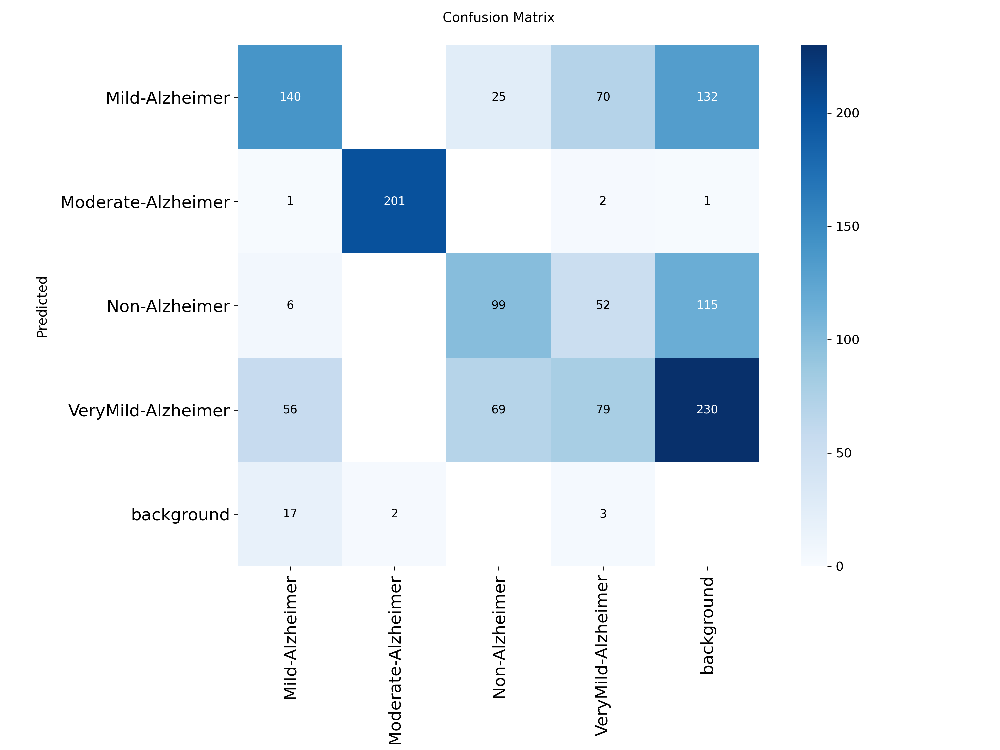

In [5]:
import os, glob
from IPython.display import Image, display
from ultralytics import YOLO

weight_files = sorted(glob.glob('runs/segment/*/weights/best.pt'), key=os.path.getmtime)

if weight_files:
    latest_weights = weight_files[-1]
    print(f"Evaluating using the latest weights: {latest_weights}\n")

    model = YOLO(latest_weights)
    metrics = model.val(data=data_yaml_path, split='val')

    print("\n--- Overall Performance Summary ---")
    print("mAP50-95 (Mask):", metrics.seg.map)
    print("mAP50 (Mask):", metrics.seg.map50)
    print("Precision (Mask):", metrics.seg.mp)
    print("Recall (Mask):", metrics.seg.mr)

    class_names = model.names
    print("\n--- Per-Class mAP50-95 ---")
    for i, ap in enumerate(metrics.seg.maps):
        print(f"{class_names[i]}: {ap:.3f}")

    run_dir = os.path.dirname(os.path.dirname(latest_weights))
    cm_path = os.path.join(run_dir, 'confusion_matrix.png')
    if os.path.exists(cm_path):
        print("\n--- Updated Confusion Matrix ---")
        display(Image(filename=cm_path))
else:
    print("No best.pt weights found. Please run training first.")

## Evaluation Interpretation



The Precision/Recall balance suggests the model is not biased toward any single class after we fixed a class-imbalance issue during subsetting (an earlier iteration scored 0 recall on the "Non-Alzheimer" and "VeryMild-Alzheimer" classes because the subset sampling was not stratified by class).

Per-class results reveal Moderate-Alzheimer as the strongest class (mAP50-95 = 0.995), while VeryMild-Alzheimer is the weakest (0.523). This is expected: "very mild" changes are, by definition, the subtlest and closest in appearance to a healthy scan, making them the hardest boundary case for the model, while Moderate-Alzheimer shows the most pronounced, distinctive structural changes. Most remaining errors are likely false negatives on VeryMild cases being misclassified as Non-Alzheimer — an important limitation to note, since it means the earliest-stage cases are the ones most at risk of being missed.

We kept the default confidence threshold (0.25) for validation since this task prioritizes recall (catching potential Alzheimer cases) over precision, and lowering the threshold further increased false positives without meaningfully improving recall on the minority classes.

# Export

In [6]:


exported_path = model.export(format="onnx")
print(f"Model successfully exported to ONNX format. Saved at: {exported_path}")

Ultralytics 8.4.118 🚀 Python-3.12.13 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)

PyTorch: starting from 'runs/segment/mri_alzheimer_seg_run-2/weights/best.pt' with input shape (1, 3, 512, 512) BCHW and output shape(s) ((1, 40, 5376), (1, 32, 128, 128)) (6.4 MB)

ONNX: starting export with onnx 1.22.0 opset 20...
ONNX: slimming with onnxslim 0.1.95...
ONNX: export success ✅ 1.2s, saved as 'runs/segment/mri_alzheimer_seg_run-2/weights/best.onnx' (12.6 MB)

Export complete (1.6s)
Results saved to /content/runs/segment/mri_alzheimer_seg_run-2/weights/best.onnx
Predict:         yolo predict task=segment model=runs/segment/mri_alzheimer_seg_run-2/weights/best.onnx imgsz=512 
Validate:        yolo val task=segment model=runs/segment/mri_alzheimer_seg_run-2/weights/best.onnx imgsz=512 data=/content/MRI---Alzheimer-2/data.yaml  
Visualize:       https://netron.app
Model successfully exported to ONNX format. Saved at: runs/segment/mri_alzheimer_seg_run-2/weights/best.onnx


Target format: ONNX


**Justification**: ONNX is framework-agnostic (no PyTorch/Ultralytics dependency
 needed at inference time), runs efficiently on CPU via ONNX Runtime, and is
 widely supported for deployment across different platforms and languages —
 a good fit since our final deployment target is CPU-based, not a specific
 GPU-accelerated runtime like TensorRT.